<a href="https://colab.research.google.com/github/Prat1209/Work-/blob/main/image_filtering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MAE6292 - Homework \# 4

Image filtering

## Import Modules



In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg as linalg
import cv2
import scipy.signal


import importlib

In [16]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [17]:
import zipfile
import os

# Extract mae6292.zip
with zipfile.ZipFile('/mae6292.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')

# Verify extraction
# Changed the argument to os.listdir to /content to list the extracted files
print("Extracted files:", os.listdir('/content/m6'))

Extracted files: ['__init__.py', 'imshow.py', 'tools.py']


In [13]:
import sys
sys.path.append('/content/m6')


In [20]:
from m6.imshow import cv2_imshow
import m6.tools as mae6292

In [21]:
def convolve2D(img, filter):
    assert (filter.shape[0]-1) % 2 == 0, 'filter size should be odd'
    W = int((filter.shape[0]-1)/2) # filter half width
    N_rows, N_cols = img.shape # image height and width

    # 1. define "img_padded" whose np.array size is (N_rows + 2W, N_cols + 2W),
    # such that it corresopnds to the img padded by zero values
    img_padded = np.pad(img, ((W, W), (W, W)), mode='constant', constant_values=0)

    # 2. define an empty "img_filtered," whose np.array size is (N_rows, N_cols)
    img_filtered = np.zeros((N_rows, N_cols))

    # 3. define "filter_flipped" using np.flip for convolution below
    filter_flipped = np.flip(filter)

    for i in range(N_rows):
        for j in range(N_cols):
            # 3. define "img_clipped" that corresponds to the clip of "img_padded" starting at (i,j).
            # Its size is equal to the filter,
            img_clipped = img_padded[i:i+2*W+1, j:j+2*W+1]

            # 4. ensure "img_clipped" is floating valued to avoid errors caused by integer * floating number
            img_clipped = img_clipped.astype('float64')

            # 5. perform cross-correlation between "img_clip" and "filter_flipped"
            img_filtered[i,j]=(img_clipped * filter_flipped).sum()

    # 6. return img_filtered
    return img_filtered

In [22]:
img_test = np.array(range(1,21)).reshape(4,5).astype('uint8')
W = 1
filter_test = np.array(range((2*W+1)**2)).reshape(2*W+1,2*W+1)
img_filtered = convolve2D(img_test,filter_test)

print('img_test=\n',img_test)
print('filter_test=\n',filter_test)
print('img_filtered=\n',img_filtered)


img_test=
 [[ 1  2  3  4  5]
 [ 6  7  8  9 10]
 [11 12 13 14 15]
 [16 17 18 19 20]]
filter_test=
 [[0 1 2]
 [3 4 5]
 [6 7 8]]
img_filtered=
 [[ 16.  41.  56.  71.  68.]
 [ 75. 156. 192. 228. 195.]
 [180. 336. 372. 408. 330.]
 [264. 452. 485. 518. 392.]]


In [23]:
W = 5
sigma = 3
filter_Gau_1D = cv2.getGaussianKernel(2*W+1, sigma)
filter_Gau_2D = filter_Gau_1D @ filter_Gau_1D.T

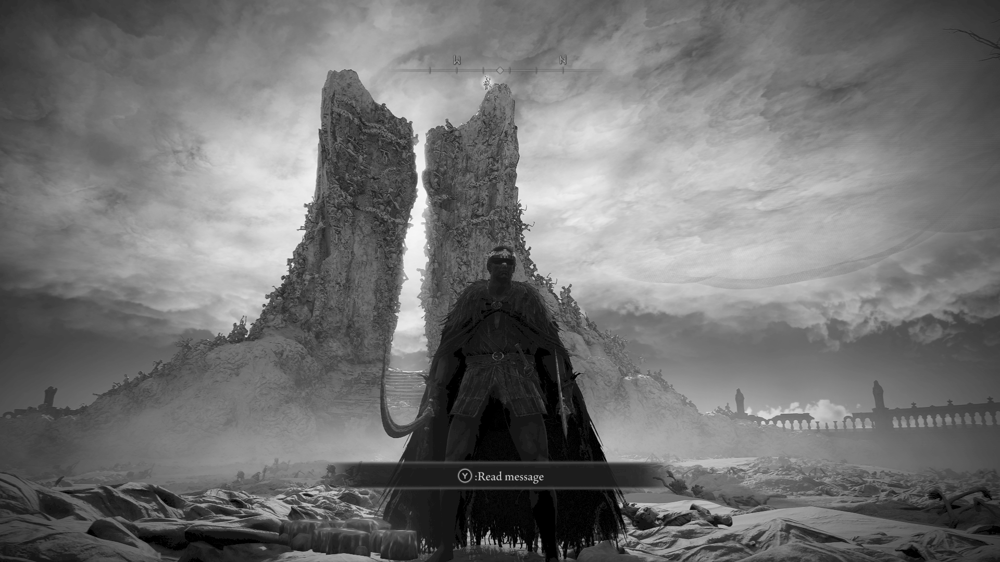

In [30]:
import cv2
from google.colab.patches import cv2_imshow # Import cv2_imshow for Colab

img = cv2.imread('/prob2a.png', cv2.IMREAD_GRAYSCALE)
cv2_imshow(img) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

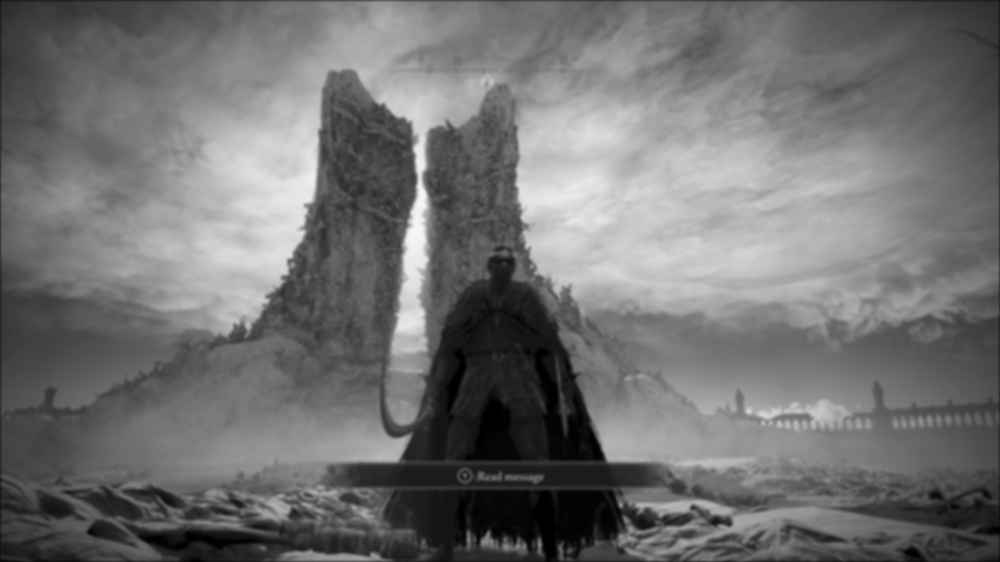

In [29]:
img_filtered = convolve2D(img, np.flip(filter_Gau_2D))
cv2.imwrite('prob2b.png', img_filtered)
# Instead of cv2.imshow, use cv2_imshow from google.colab.patches
from google.colab.patches import cv2_imshow
cv2_imshow(img_filtered) # Display the filtered image using cv2_imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

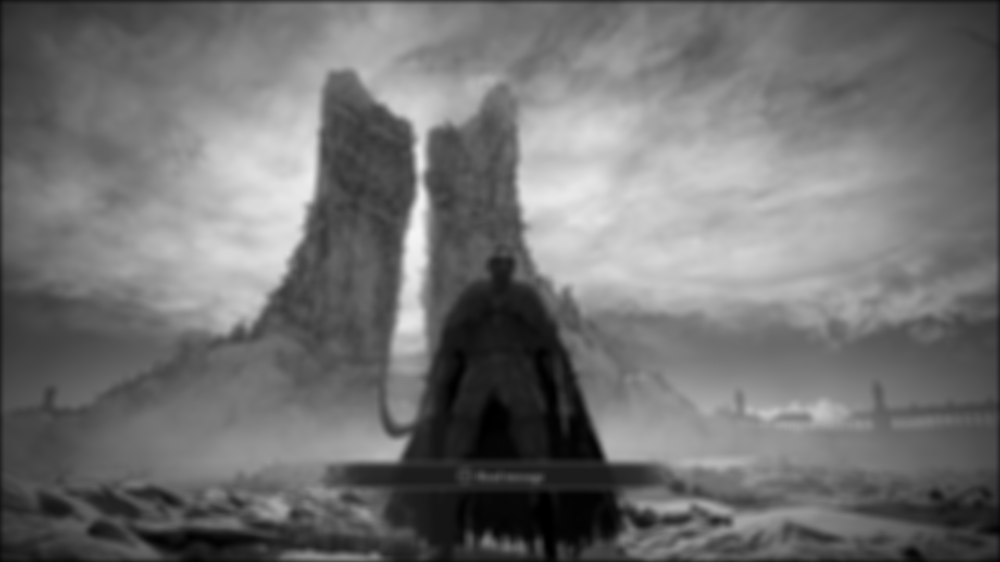

In [34]:
W_new = 10  # Example new values
sigma_new = 7
filter_Gau_1D_new = cv2.getGaussianKernel(2*W_new+1, sigma_new)
filter_Gau_2D_new = filter_Gau_1D_new @ filter_Gau_1D_new.T
img_filtered_new = convolve2D(img, np.flip(filter_Gau_2D_new))
cv2.imwrite('prob2c.png', img_filtered_new)
# Instead of cv2.imshow, use cv2_imshow from google.colab.patches
from google.colab.patches import cv2_imshow
cv2_imshow(img_filtered_new) # Display the filtered image using cv2_imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

In [38]:
def convolve2D(img, filter):
    assert (filter.shape[0]-1) % 2 == 0, 'filter size should be odd'
    W = int((filter.shape[0]-1)/2) # filter half width

    # Check if the image is color (3 dimensions) or grayscale (2 dimensions)
    if len(img.shape) == 3:  # If color image
        N_rows, N_cols, N_channels = img.shape # Get height, width, and channels
        # Create an empty filtered image with the same dimensions as the original
        img_filtered = np.zeros_like(img, dtype=np.float64)
        # Apply convolution to each channel separately
        for channel in range(N_channels):
            # Extract the current channel
            img_channel = img[:, :, channel]
            # Pad the current channel
            img_padded = np.pad(img_channel, ((W, W), (W, W)), mode='constant', constant_values=0)
            # Apply the convolution for the current channel
            for i in range(N_rows):
                for j in range(N_cols):
                    img_clipped = img_padded[i:i+2*W+1, j:j+2*W+1]
                    img_clipped = img_clipped.astype('float64')
                    img_filtered[i, j, channel] = (img_clipped * np.flip(filter)).sum()
    else:  # If grayscale image (2 dimensions)
        N_rows, N_cols = img.shape # Get height and width
        img_padded = np.pad(img, ((W, W), (W, W)), mode='constant', constant_values=0)
        img_filtered = np.zeros((N_rows, N_cols), dtype=np.float64)
        for i in range(N_rows):
            for j in range(N_cols):
                img_clipped = img_padded[i:i+2*W+1, j:j+2*W+1]
                img_clipped = img_clipped.astype('float64')
                img_filtered[i,j]=(img_clipped * np.flip(filter)).sum()

    return img_filtered

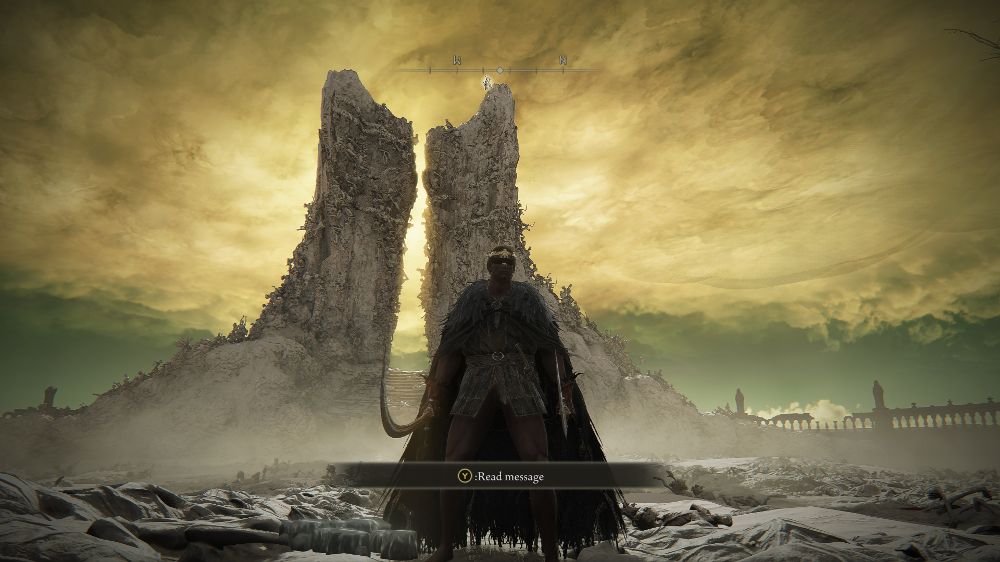

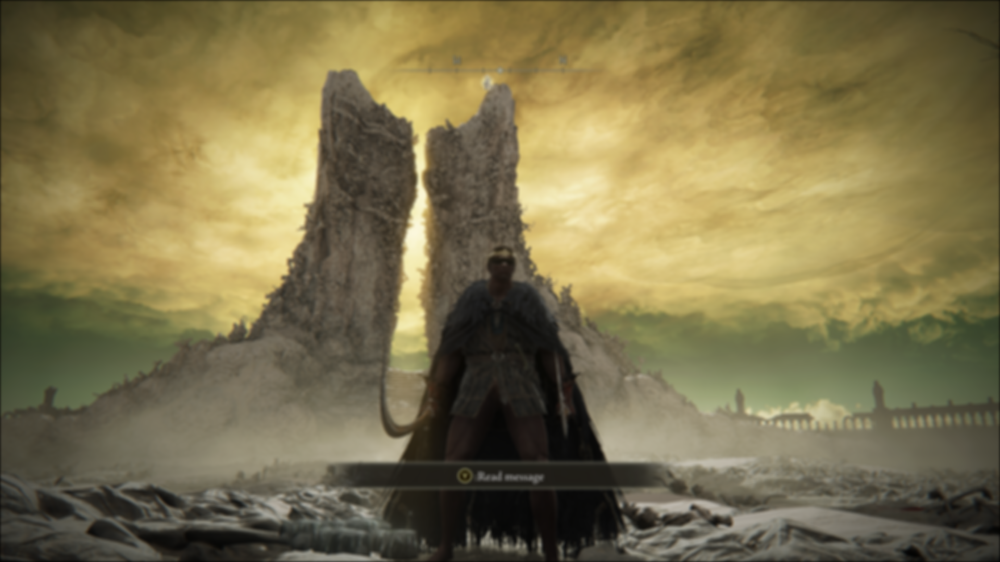

In [39]:
W = 5
sigma = 3
filter_Gau_1D = cv2.getGaussianKernel(2*W+1, sigma)
filter_Gau_2D = filter_Gau_1D @ filter_Gau_1D.T
# Load and process the image (Color)
img_color = cv2.imread('/prob2a.png')
# Replace cv2.imshow with cv2_imshow
from google.colab.patches import cv2_imshow  # Import cv2_imshow
cv2_imshow(img_color) # Use cv2_imshow to display the image
cv2.waitKey(0)
cv2.destroyAllWindows()

# Apply Gaussian Filter to Color Image
img_filtered_color = convolve2D(img_color, np.flip(filter_Gau_2D))
cv2.imwrite('prob2d.png', img_filtered_color)
# Replace cv2.imshow with cv2_imshow
from google.colab.patches import cv2_imshow  # Import cv2_imshow (if not already imported)
cv2_imshow(img_filtered_color) # Use cv2_imshow to display the image
cv2.waitKey(0)
cv2.destroyAllWindows()

In [40]:
cv2.imwrite('prob2d.png', img_filtered_color)

True